In [1]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\Adwait\Desktop\Skin Lesions\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [2]:
pip install torchvision

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\Adwait\Desktop\Skin Lesions\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [3]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\Adwait\Desktop\Skin Lesions\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [4]:
pip install keras


Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\Adwait\Desktop\Skin Lesions\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [5]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\Adwait\Desktop\Skin Lesions\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [6]:
pip install imageio

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\Adwait\Desktop\Skin Lesions\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [28]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
from matplotlib import pyplot as plt
import imageio
import seaborn as sns

In [29]:
# importing metadata
metadata = pd.read_csv('HAM10000_metadata.csv')

# label encoding the seven classes for skin cancers
le = preprocessing.LabelEncoder()
le.fit(metadata['dx'])
print("Classes:", list(le.classes_))
 
metadata['label'] = le.transform(metadata["dx"]) 
metadata.sample(10)

Classes: ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']


,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,label
4835,HAM_0001977,ISIC_0029261,nv,follow_up,55.0,female,lower extremity,vidir_molemax,5
3061,HAM_0007203,ISIC_0031845,nv,follow_up,55.0,male,upper extremity,vidir_molemax,5
4438,HAM_0005070,ISIC_0030863,nv,follow_up,55.0,female,trunk,vidir_molemax,5
9122,HAM_0006104,ISIC_0030663,nv,histo,30.0,male,back,rosendahl,5
3182,HAM_0003064,ISIC_0029966,nv,follow_up,40.0,male,upper extremity,vidir_molemax,5
9090,HAM_0000798,ISIC_0031064,nv,histo,65.0,male,foot,rosendahl,5
1796,HAM_0003700,ISIC_0033099,mel,histo,40.0,female,lower extremity,vidir_modern,4
7839,HAM_0001509,ISIC_0033044,nv,histo,25.0,male,lower extremity,vidir_modern,5
517,HAM_0001958,ISIC_0029580,bkl,histo,60.0,female,face,rosendahl,2
5956,HAM_0000600,ISIC_0028311,nv,follow_up,45.0,male,foot,vidir_molemax,5


In [30]:
colname=(metadata.columns.values.tolist())

C:\Users\Adwait\Desktop\Skin Lesions\myenv\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


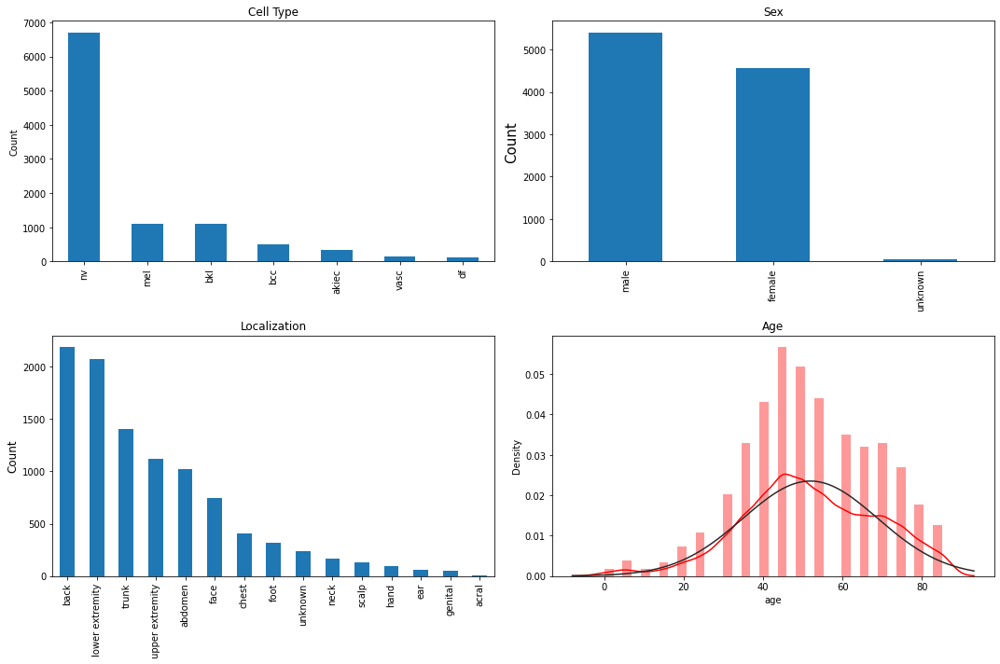

In [31]:
from scipy.stats import norm
# Getting a sense of what the distribution of each column looks like
fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
metadata['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type');

ax2 = fig.add_subplot(222)
metadata['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex');

ax3 = fig.add_subplot(223)
metadata['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count',size=12)
ax3.set_title('Localization')


ax4 = fig.add_subplot(224)
sample_age = metadata[pd.notnull(metadata['age'])]
sns.distplot(sample_age['age'], fit=norm, color='red');
ax4.set_title('Age')

plt.tight_layout()
plt.show()

In [32]:
data=pd.read_csv("HAM10000_metadata.csv",header=None)
for i in range(data.shape[1]):
# count number of rows with missing values
    n_miss = data[[i]].isnull().sum()
    perc = n_miss / data.shape[0] * 100
    print('> %s, Missing: %d (%.1f%%)' % (colname[i], n_miss, perc))

> lesion_id, Missing: 0 (0.0%)
> image_id, Missing: 0 (0.0%)
> dx, Missing: 0 (0.0%)
> dx_type, Missing: 0 (0.0%)
> age, Missing: 57 (0.6%)
> sex, Missing: 0 (0.0%)
> localization, Missing: 0 (0.0%)
> dataset, Missing: 0 (0.0%)


In [33]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
np.random.seed(123)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix
import itertools

import keras
from keras.utils.np_utils import to_categorical # used for converting labels to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras import backend as K
import itertools
from tensorflow.keras.layers import (
    BatchNormalization, SeparableConv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense
)
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import train_test_split

In [34]:

base_skin_dir = os.path.join('Images/')


# Merging images from both folders HAM10000_images_part1.zip and HAM10000_images_part2.zip into one dictionary

imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))}


# This dictionary is useful for displaying more human-friendly labels later on

lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [35]:
skin_df = pd.read_csv('HAM10000_metadata.csv')

# Creating New Columns for better readability

skin_df['path'] = skin_df['image_id'].map(imageid_path_dict.get)
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get) 
skin_df['cell_type_idx'] = pd.Categorical(skin_df['cell_type']).codes

# Now lets see the sample of tile_df to look on newly made columns
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern,Images\HAM10000_images_part_1\ISIC_0027419.jpg,Benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern,Images\HAM10000_images_part_1\ISIC_0025030.jpg,Benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern,Images\HAM10000_images_part_1\ISIC_0026769.jpg,Benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern,Images\HAM10000_images_part_1\ISIC_0025661.jpg,Benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern,Images\HAM10000_images_part_2\ISIC_0031633.jpg,Benign keratosis-like lesions,2


In [36]:
skin_df['image']= skin_df['path'].map(lambda x: np.asarray(Image.open(x).resize((100,75))))

In [37]:
skin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   lesion_id      10015 non-null  object 
 1   image_id       10015 non-null  object 
 2   dx             10015 non-null  object 
 3   dx_type        10015 non-null  object 
 4   age            9958 non-null   float64
 5   sex            10015 non-null  object 
 6   localization   10015 non-null  object 
 7   dataset        10015 non-null  object 
 8   path           10015 non-null  object 
 9   cell_type      10015 non-null  object 
 10  cell_type_idx  10015 non-null  int8   
 11  image          10015 non-null  object 
dtypes: float64(1), int8(1), object(10)
memory usage: 870.6+ KB


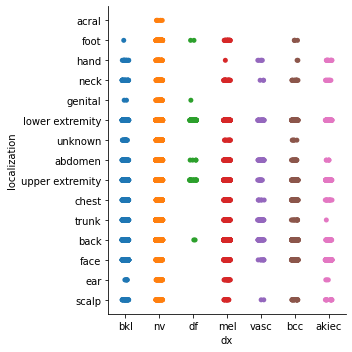

In [38]:

sns.catplot(x="dx", y="localization", data=skin_df)

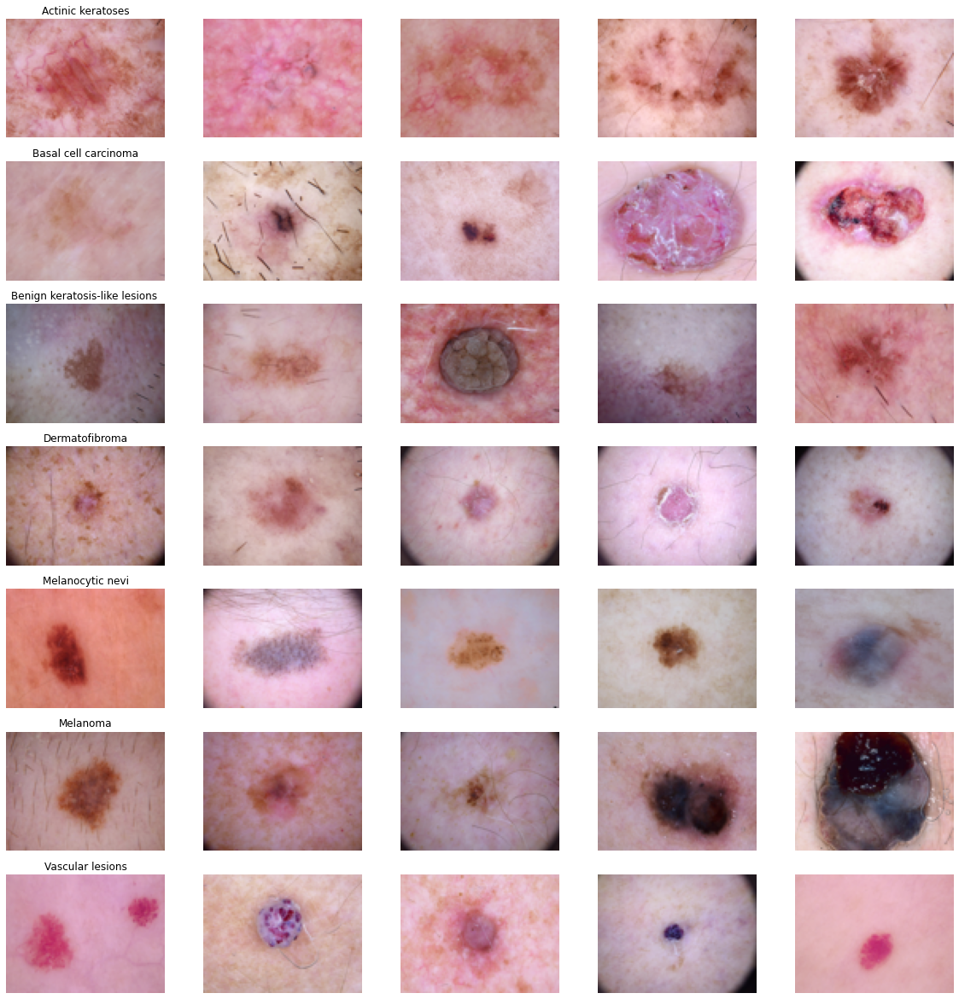

In [39]:
n_samples = 5  # number of samples of each cancer type

# Plotting code
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300) 

In [40]:
skin_df.to_csv('Skin_df.csv', header=True, index=False)

In [41]:
features=skin_df.drop(columns=['cell_type_idx'],axis=1)

target=skin_df['cell_type_idx']

In [42]:
import pandas as pd
  
# read specific columns of csv file using Pandas
x = pd.read_csv("Skin_df.csv", usecols = ['dx','path'])
print(x)

          dx                                            path
0        bkl  Images\HAM10000_images_part_1\ISIC_0027419.jpg
1        bkl  Images\HAM10000_images_part_1\ISIC_0025030.jpg
2        bkl  Images\HAM10000_images_part_1\ISIC_0026769.jpg
3        bkl  Images\HAM10000_images_part_1\ISIC_0025661.jpg
4        bkl  Images\HAM10000_images_part_2\ISIC_0031633.jpg
...      ...                                             ...
10010  akiec  Images\HAM10000_images_part_2\ISIC_0033084.jpg
10011  akiec  Images\HAM10000_images_part_2\ISIC_0033550.jpg
10012  akiec  Images\HAM10000_images_part_2\ISIC_0033536.jpg
10013  akiec  Images\HAM10000_images_part_2\ISIC_0032854.jpg
10014    mel  Images\HAM10000_images_part_2\ISIC_0032258.jpg

[10015 rows x 2 columns]


In [43]:
dict1={}

for l in lesion_type_dict.keys():
        count=0
        for k,v in x.iterrows():
            if(l==v[0] and count<1):
                dict1[v[1]]=l
                count+=1
print(dict1)

{'Images\\HAM10000_images_part_1\\ISIC_0024698.jpg': 'nv', 'Images\\HAM10000_images_part_1\\ISIC_0025964.jpg': 'mel', 'Images\\HAM10000_images_part_1\\ISIC_0027419.jpg': 'bkl', 'Images\\HAM10000_images_part_1\\ISIC_0028155.jpg': 'bcc', 'Images\\HAM10000_images_part_2\\ISIC_0029417.jpg': 'akiec', 'Images\\HAM10000_images_part_2\\ISIC_0031197.jpg': 'vasc', 'Images\\HAM10000_images_part_1\\ISIC_0027008.jpg': 'df'}


In [44]:
x_train_o, x_test_o, y_train_o, y_test_o = train_test_split(features, target, test_size=0.20,random_state=123)


In [45]:
x_train = np.asarray(x_train_o['image'].tolist())
x_test = np.asarray(x_test_o['image'].tolist())

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)

x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_test_std

In [46]:
y_train = to_categorical(y_train_o, num_classes = 7)
y_test = to_categorical(y_test_o, num_classes = 7)

In [47]:
x_train, x_validate, y_train, y_validate = train_test_split(x_train, y_train, test_size = 0.1, random_state = 2)


In [48]:
# Reshape image in 3 dimensions (height = 75px, width = 100px , canal = 3)
x_train = x_train.reshape(x_train.shape[0], *(75, 100, 3))
x_test = x_test.reshape(x_test.shape[0], *(75, 100, 3))
x_validate = x_validate.reshape(x_validate.shape[0], *(75, 100, 3))

In [49]:
input_shape = (75, 100, 3)
num_classes = 7

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',padding = 'Same',input_shape=input_shape))
model.add(Conv2D(32,kernel_size=(3, 3), activation='relu',padding = 'Same',))
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same'))
model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.40))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 75, 100, 32)       896       
                                                                 
 conv2d_1 (Conv2D)           (None, 75, 100, 32)       9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 37, 50, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 37, 50, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 37, 50, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 37, 50, 64)        36928     
                                                        

In [50]:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

# Compile the model
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])

# Set a learning rate annealer
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

C:\Users\Adwait\Desktop\Skin Lesions\myenv\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [51]:
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images

datagen.fit(x_train)

In [52]:
epochs = 50 
batch_size = 10
history = model.fit_generator(datagen.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_validate,y_validate),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size
                              , callbacks=[learning_rate_reduction])

C:\Users\Adwait\AppData\Local\Temp\ipykernel_31112\2425192928.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(datagen.flow(x_train,y_train, batch_size=batch_size),


Epoch 1/50
721/721 [==============================] - 196s 265ms/step - loss: 1.0171 - accuracy: 0.6678 - val_loss: 0.9330 - val_accuracy: 0.6546 - lr: 0.0010
Epoch 2/50
721/721 [==============================] - 188s 261ms/step - loss: 0.9123 - accuracy: 0.6739 - val_loss: 0.8538 - val_accuracy: 0.6584 - lr: 0.0010
Epoch 3/50
721/721 [==============================] - 167s 232ms/step - loss: 0.8721 - accuracy: 0.6810 - val_loss: 0.8659 - val_accuracy: 0.6833 - lr: 0.0010
Epoch 4/50
721/721 [==============================] - 160s 223ms/step - loss: 0.8379 - accuracy: 0.6932 - val_loss: 0.8274 - val_accuracy: 0.7082 - lr: 0.0010
Epoch 5/50
721/721 [==============================] - 161s 223ms/step - loss: 0.8274 - accuracy: 0.7019 - val_loss: 0.7941 - val_accuracy: 0.7170 - lr: 0.0010
Epoch 6/50
721/721 [==============================] - 149s 206ms/step - loss: 0.8136 - accuracy: 0.6993 - val_loss: 0.8639 - val_accuracy: 0.6908 - lr: 0.0010
Epoch 7/50
721/721 [==========================

721/721 [==============================] - 149s 206ms/step - loss: 0.6739 - accuracy: 0.7551 - val_loss: 0.7483 - val_accuracy: 0.7282 - lr: 0.0010
Epoch 42/50
721/721 [==============================] - 18254s 25s/step - loss: 0.6570 - accuracy: 0.7623 - val_loss: 0.7142 - val_accuracy: 0.7294 - lr: 0.0010
Epoch 43/50
721/721 [==============================] - 200s 277ms/step - loss: 0.6472 - accuracy: 0.7612 - val_loss: 0.7160 - val_accuracy: 0.7569 - lr: 0.0010
Epoch 44/50
721/721 [==============================] - 184s 255ms/step - loss: 0.6537 - accuracy: 0.7637 - val_loss: 0.7469 - val_accuracy: 0.7244 - lr: 0.0010
Epoch 45/50
721/721 [==============================] - 179s 248ms/step - loss: 0.6520 - accuracy: 0.7614 - val_loss: 0.7255 - val_accuracy: 0.7406 - lr: 0.0010
Epoch 46/50
721/721 [==============================] - 179s 248ms/step - loss: 0.6578 - accuracy: 0.7588 - val_loss: 0.7395 - val_accuracy: 0.7232 - lr: 0.0010
Epoch 47/50
721/721 [==============================]

In [54]:
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
loss_v, accuracy_v = model.evaluate(x_validate, y_validate, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (accuracy_v, loss_v))
print("Test: accuracy = %f  ;  loss = %f" % (accuracy, loss))
model.save("model.h5")

26/26 [==============================] - 3s 131ms/step - loss: 0.7457 - accuracy: 0.7244
Validation: accuracy = 0.724439  ;  loss_v = 0.745718
Test: accuracy = 0.722916  ;  loss = 0.721635


In [8]:
pip install cv2

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2
You should consider upgrading via the 'C:\Users\Adwait\Desktop\Skin Lesions\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [7]:
import cv2

#IMAGE ACQUISITION

#Input image
path='Images/HAM10000_images_part_2/ISIC_0031023.jpg'
#Read image
image=cv2.imread(path,cv2.IMREAD_COLOR)

#Image cropping
img=image[30:410,30:560]
print(img)
#DULL RAZOR (REMOVE HAIR)

#Gray scale
grayScale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY )
#Black hat filter
kernel = cv2.getStructuringElement(1,(9,9)) 
blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
#Gaussian filter
bhg= cv2.GaussianBlur(blackhat,(3,3),cv2.BORDER_DEFAULT)
#Binary thresholding (MASK)
ret,mask = cv2.threshold(bhg,10,255,cv2.THRESH_BINARY)
#Replace pixels of the mask
dst = cv2.inpaint(img,mask,6,cv2.INPAINT_TELEA)   

#Display images
cv2.imshow("Original image",image)
cv2.imshow("Cropped image",img)
cv2.imshow("Gray Scale image",grayScale)
cv2.imshow("Blackhat",blackhat)
cv2.imshow("Binary mask",mask)
cv2.imshow("Clean image",dst)

cv2.waitKey()


cv2.destroyAllWindows()

[]


error: OpenCV(4.6.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [31]:

import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline


    

def ORBmethod(k,v):
    # Load the image
    image1 = cv2.imread(k)

    # Convert the training image to RGB
    training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

    # Convert the training image to gray scale
    training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

    # Create test image by adding Scale Invariance and Rotational Invariance
    test_image = cv2.pyrDown(training_image)
    test_image = cv2.pyrDown(test_image)
    num_rows, num_cols = test_image.shape[:2]

    rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
    test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

    test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

    # Display traning image and testing image
    fx, plots = plt.subplots(1, 2, figsize=(20,10))

    plots[0].set_title("Training Image "+v)
    plots[0].imshow(training_image)

    plots[1].set_title("Testing Image "+v)
    plots[1].imshow(test_image)
    
    ######
    
    orb = cv2.ORB_create()

    train_keypoints, train_descriptor = orb.detectAndCompute(training_gray, None)
    test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

    keypoints_without_size = np.copy(training_image)
    keypoints_with_size = np.copy(training_image)

    cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))

    cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display image with and without keypoints size
    fx, plots = plt.subplots(1, 2, figsize=(20,10))

    plots[0].set_title("Train keypoints With Size")
    plots[0].imshow(keypoints_with_size, cmap='gray')

    plots[1].set_title("Train keypoints Without Size")
    plots[1].imshow(keypoints_without_size, cmap='gray')
    plt.show()

    # Print the number of keypoints detected in the training image
    print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))
        ################
    
    # Create a Brute Force Matcher object.
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

    # Perform the matching between the BRIEF descriptors of the training image and the test image
    matches = bf.match(train_descriptor, test_descriptor)

    # The matches with shorter distance are the ones we want.
    matches = sorted(matches, key = lambda x : x.distance)

    result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

    # Display the best matching points
    plt.rcParams['figure.figsize'] = [14.0, 7.0]
    plt.title('Best Matching Points')
    plt.imshow(result)
    plt.show()

    # Print total number of matching points between the training and query images
    print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))
    print("\n")


    
    

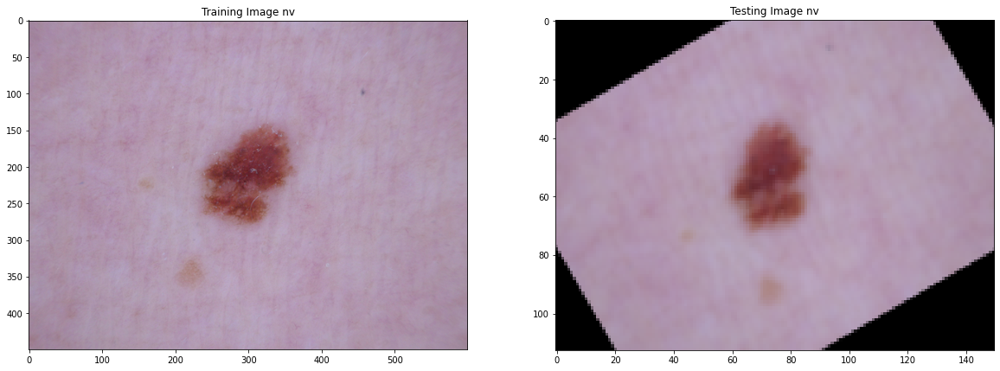

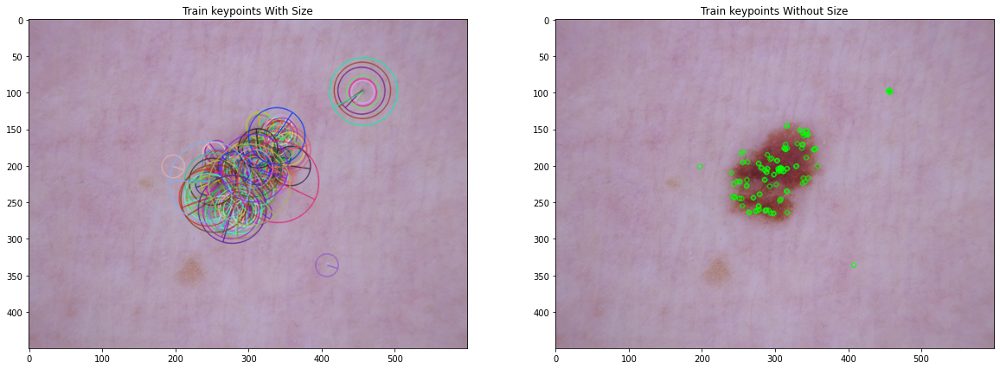

Number of Keypoints Detected In The Training Image:  135
Number of Keypoints Detected In The Query Image:  12


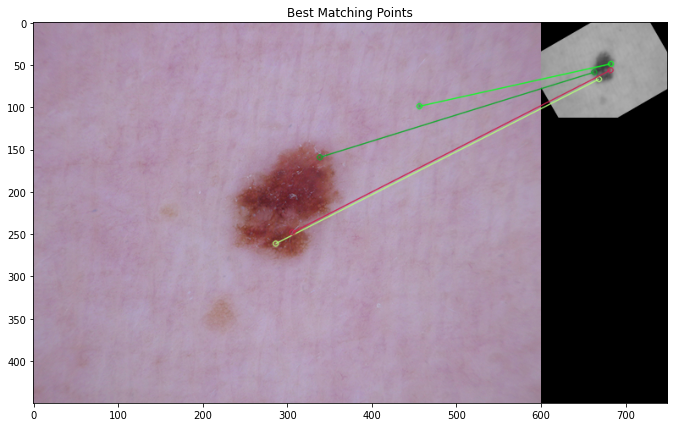


Number of Matching Keypoints Between The Training and Query Images:  4




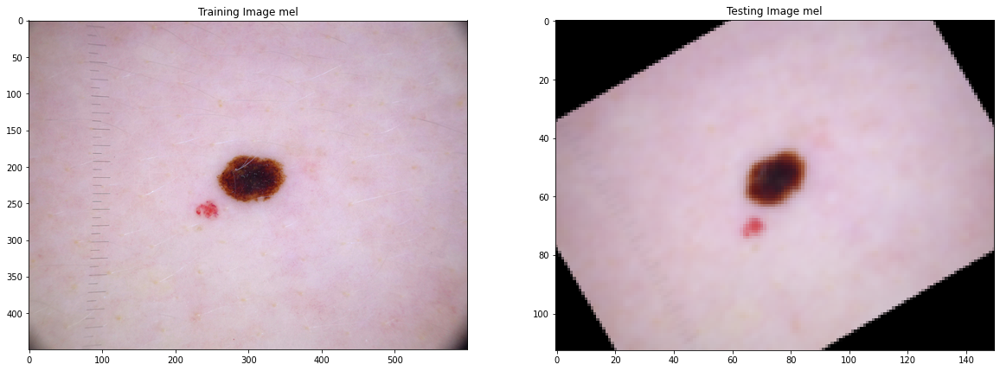

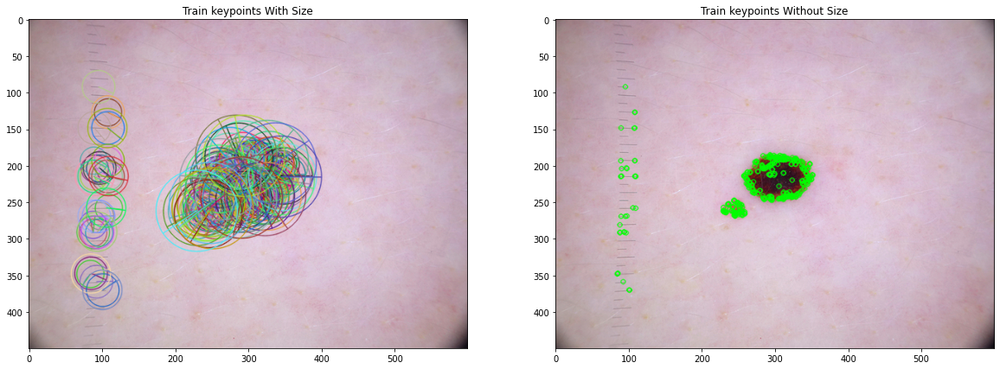

Number of Keypoints Detected In The Training Image:  354
Number of Keypoints Detected In The Query Image:  33


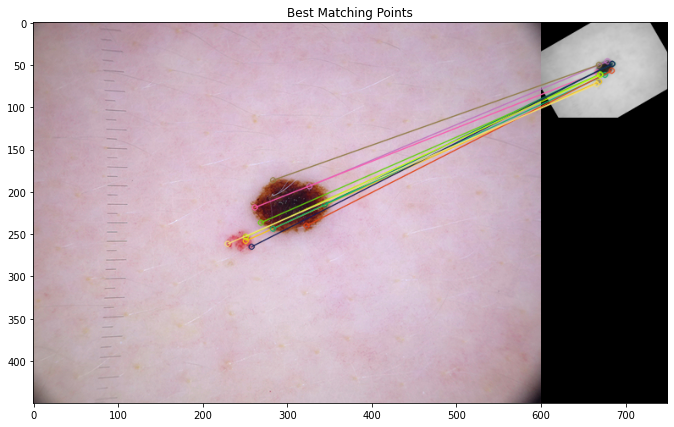


Number of Matching Keypoints Between The Training and Query Images:  11




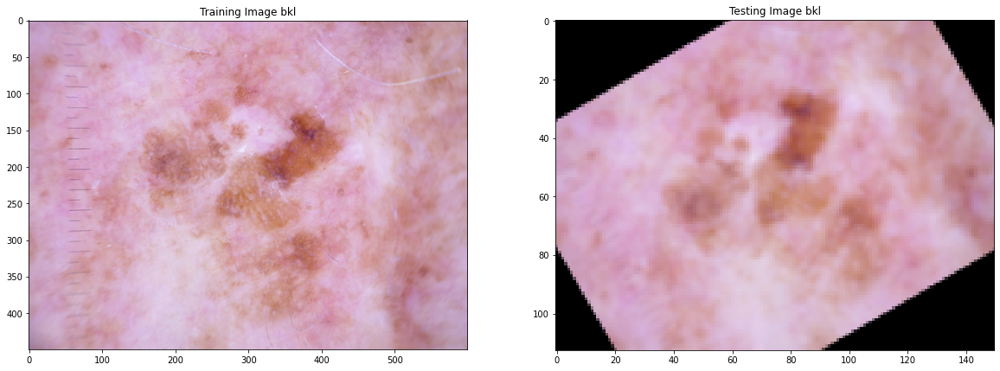

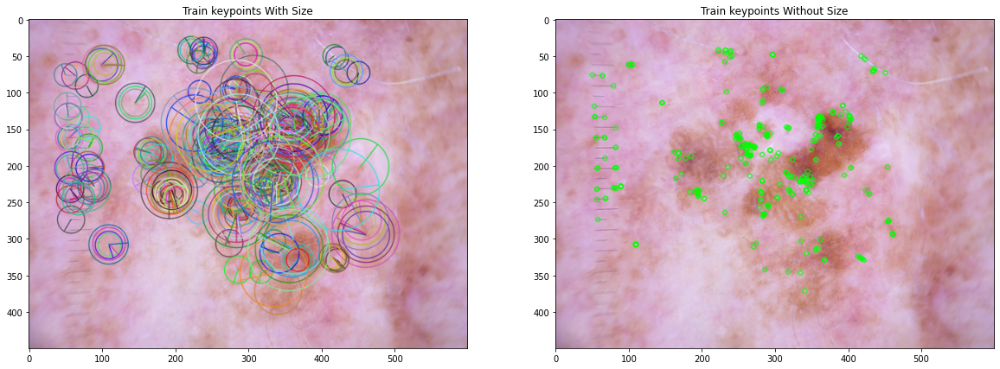

Number of Keypoints Detected In The Training Image:  321
Number of Keypoints Detected In The Query Image:  28


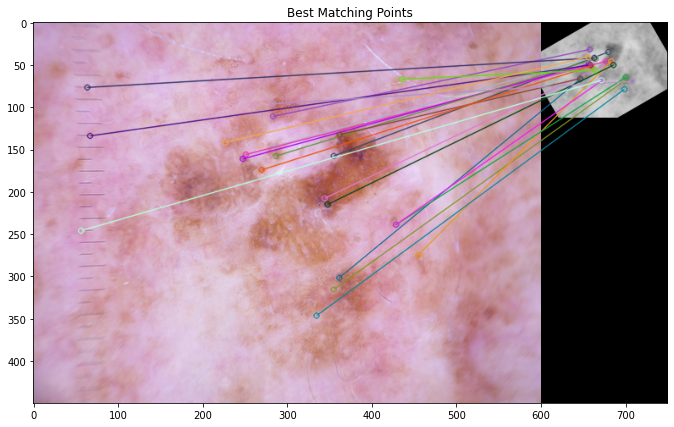


Number of Matching Keypoints Between The Training and Query Images:  22




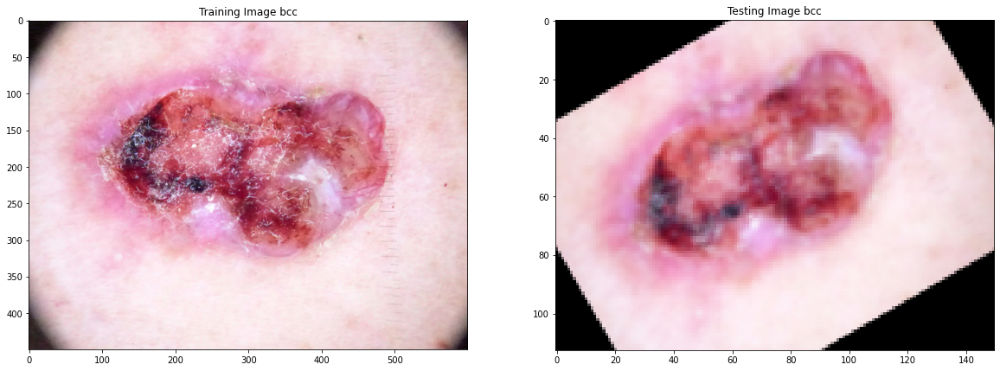

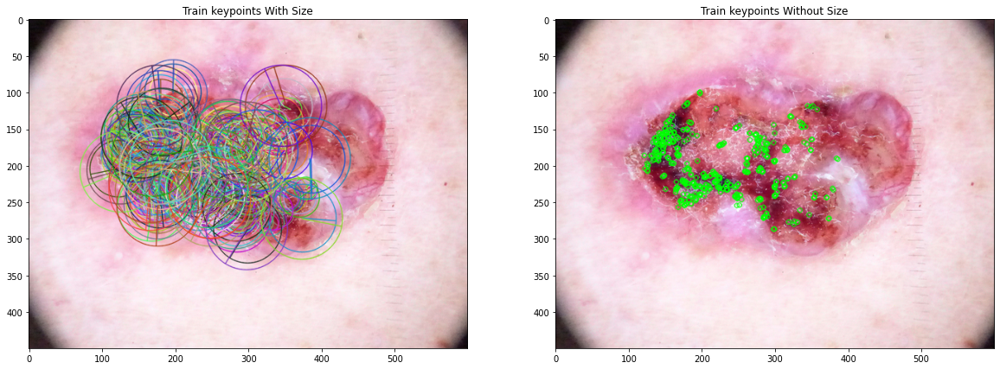

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  151


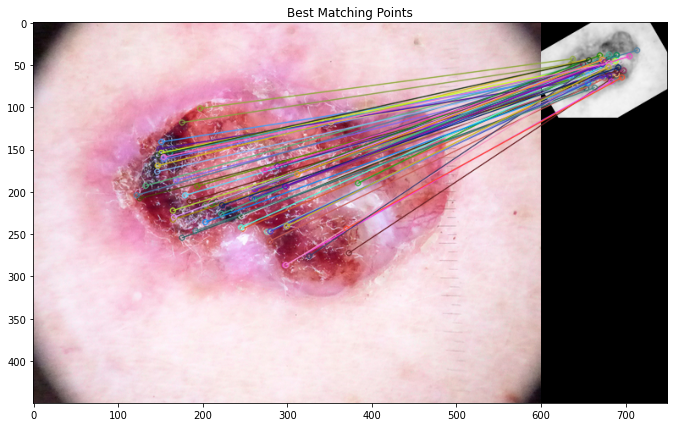


Number of Matching Keypoints Between The Training and Query Images:  56




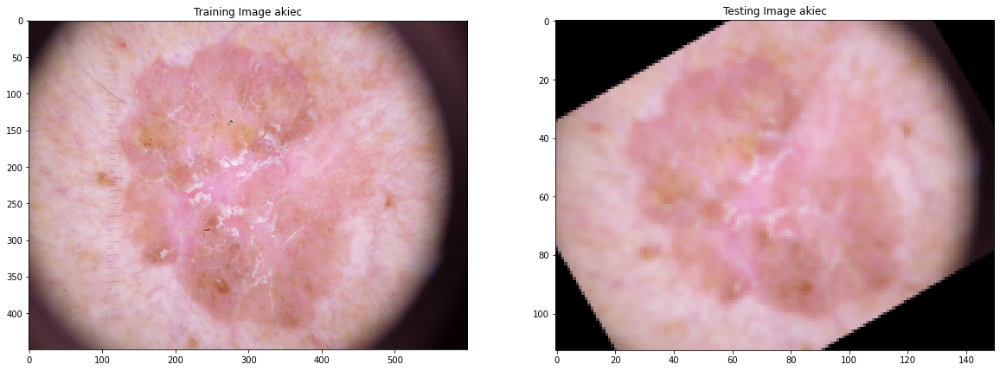

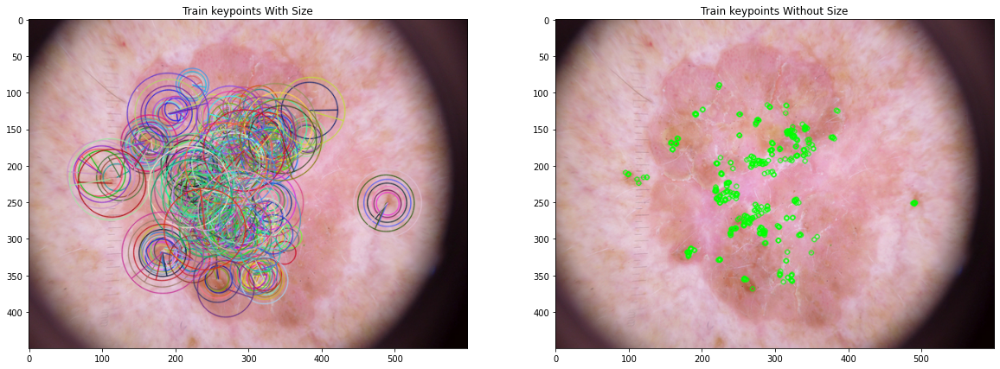

Number of Keypoints Detected In The Training Image:  443
Number of Keypoints Detected In The Query Image:  12


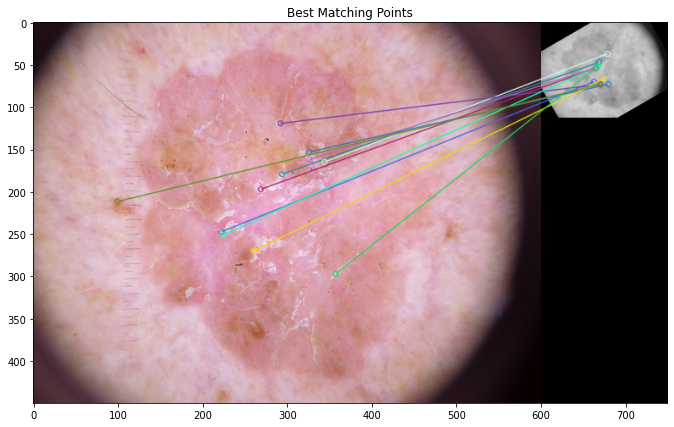


Number of Matching Keypoints Between The Training and Query Images:  11




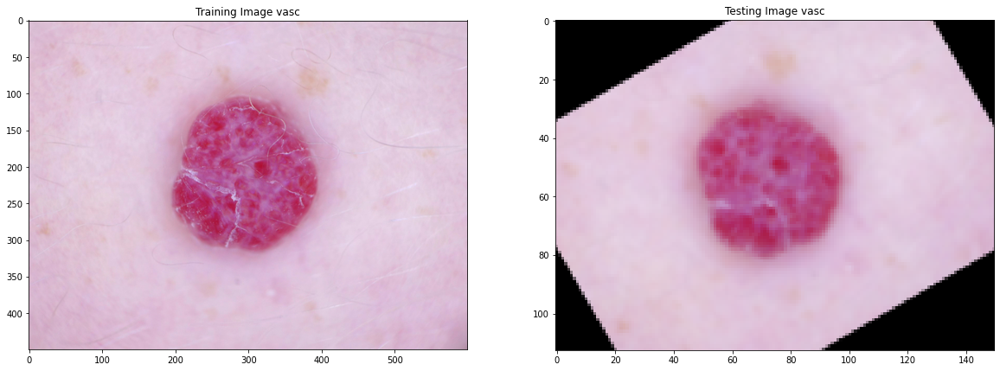

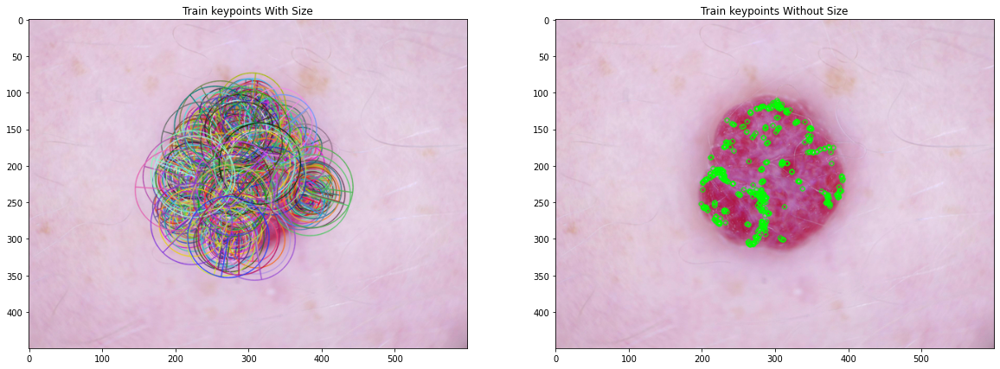

Number of Keypoints Detected In The Training Image:  467
Number of Keypoints Detected In The Query Image:  31


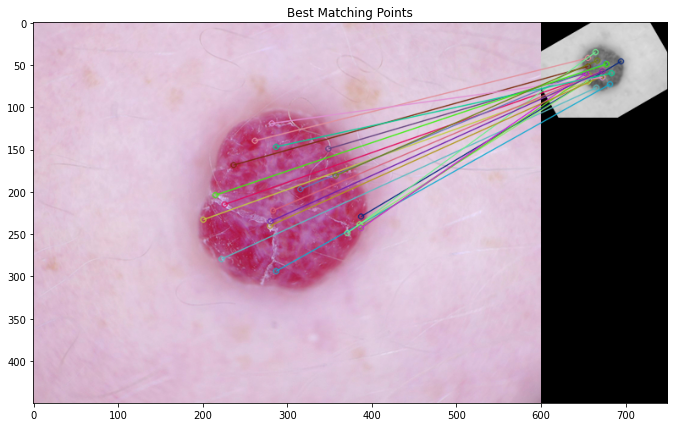


Number of Matching Keypoints Between The Training and Query Images:  20




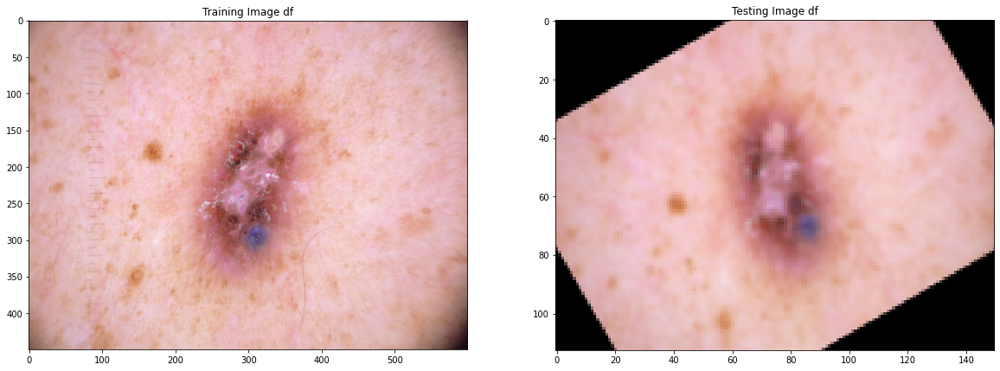

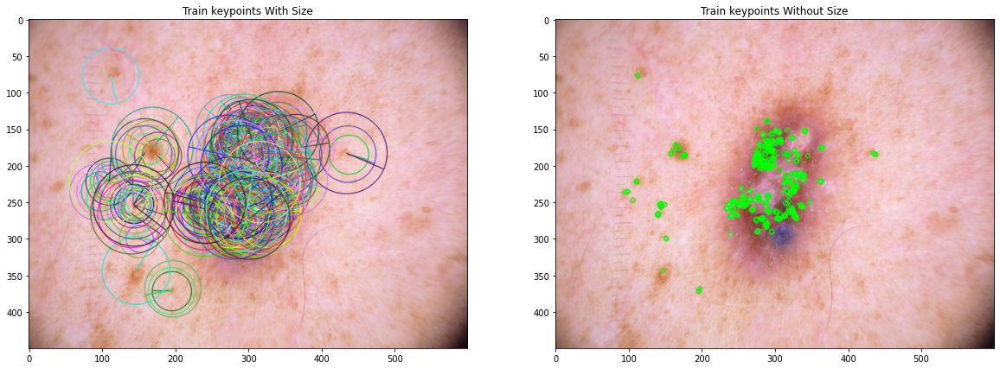

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  42


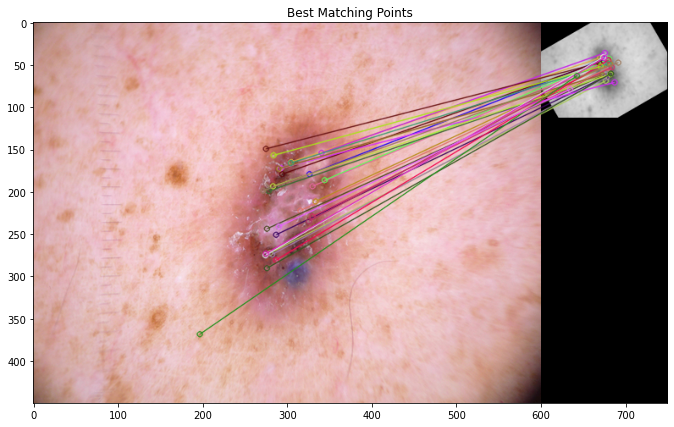


Number of Matching Keypoints Between The Training and Query Images:  29




In [26]:
for k,v in dict1.items():
    ORBmethod(k,v)

In [67]:
import sys
sys.setrecursionlimit(60)

def first(string):
    #print("first({})".format(string))
    first_ = set()
    if string in non_terminals:
        alternatives = productions_dict[string]

        for alternative in alternatives:
            first_2 = first(alternative)
            first_ = first_ |first_2

    elif string in terminals:
        first_ = {string}

    elif string=='' or string=='@':
        first_ = {'@'}

    else:
        first_2 = first(string[0])
        if '@' in first_2:
            i = 1
            while '@' in first_2:
                #print("inside while")

                first_ = first_ | (first_2 - {'@'})
                #print('string[i:]=', string[i:])
                if string[i:] in terminals:
                    first_ = first_ | {string[i:]}
                    break
                elif string[i:] == '':
                    first_ = first_ | {'@'}
                    break
                first_2 = first(string[i:])
                first_ = first_ | first_2 - {'@'}
                i += 1
        else:
            first_ = first_ | first_2


    #print("returning for first({})".format(string),first_)
    return  first_


def follow(nT):
    #print("inside follow({})".format(nT))
    follow_ = set()
    #print("FOLLOW", FOLLOW)
    prods = productions_dict.items()
    if nT==starting_symbol:
        follow_ = follow_ | {'$'}
    for nt,rhs in prods:
        #print("nt to rhs", nt,rhs)
        for alt in rhs:
            for char in alt:
                if char==nT:
                    following_str = alt[alt.index(char) + 1:]
                    if following_str=='':
                        if nt==nT:
                            continue
                        else:
                            follow_ = follow_ | follow(nt)
                    else:
                        follow_2 = first(following_str)
                        if '@' in follow_2:
                            follow_ = follow_ | follow_2-{'@'}
                            follow_ = follow_ | follow(nt)
                        else:
                            follow_ = follow_ | follow_2
    #print("returning for follow({})".format(nT),follow_)
    return follow_



def eliminate1(x):
    if(x[0]==x[3]):
        index=x.index('|')
        string1=x[:3]+x[index+1]+x[0]+"'"
        string2=x[0]+"'->"+x[4]+x[0]+"'|e"
        print("Removal of Left Recursion")
        print(string1)
        print(string2)
            
            

no_of_terminals=int(input("Enter no. of terminals: "))

terminals = []

print("Enter the terminals :")
for _ in range(no_of_terminals):
    terminals.append(input())

no_of_non_terminals=int(input("Enter no. of non terminals: "))

non_terminals = []

print("Enter the non terminals :")
for _ in range(no_of_non_terminals):
    non_terminals.append(input())

starting_symbol = input("Enter the starting symbol: ")

no_of_productions = int(input("Enter no of productions: "))

productions = []

print("Enter the productions:")
for _ in range(no_of_productions):
    productions.append(input())


#print("terminals", terminals)

#print("non terminals", non_terminals)

print("productions",productions)
for i in productions:
    eliminate1(i)



Enter no. of terminals: 2
Enter the terminals :
a
b
Enter no. of non terminals: 1
Enter the non terminals :
A
Enter the starting symbol: A
Enter no of productions: 1
Enter the productions:
A->Aa|b
productions ['A->Aa|b']
Removal of Left Recursion
A->bA'
A'->aA'|e
